<a href="https://colab.research.google.com/github/ayok007/Location_de_voitures/blob/master/defenses__mnist_clothes___.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Detector Defense in ART

## Importing dependencies

In [ ]:
!pip install adversarial-robustness-toolbox

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.8 MB/s eta 0:00:00


In [ ]:
# Importing dependencies
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning.perturbations import add_pattern_bd
from art.defences.detector.poison import ActivationDefence
from art.estimators.classification import TensorFlowV2Classifier
from art.utils import load_dataset, to_categorical
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pprint
import json

# Disabling eager execution from TF 2
#tf.compat.v1.disable_eager_execution()

# Increasing Matplotlib font size
matplotlib.rcParams.update({"font.size": 14})

## Poisoning data for the attack

In [ ]:
# Loading data
#(train_images_original, train_labels_original), (test_images_original, test_labels_original), min, max = load_dataset(name="mnist")


# Loading the data
#(train_images, train_labels), (test_images, test_labels), min, max = load_dataset(name="mnist")

# Loading the Fashion MNIST data
fashion_mnist = keras.datasets.fashion_mnist
(train_images_original, train_labels_original), (test_images_original, test_labels_original) = fashion_mnist.load_data()

# Preprocessing the data
# Normalize the images to the range [0, 1]
train_images_original = train_images_original.astype('float32') / 255.0
test_images_original = test_images_original.astype('float32') / 255.0

# Add a channel dimension (required by Conv2D layers)
train_images_original = np.expand_dims(train_images_original, axis=-1)
test_images_original = np.expand_dims(test_images_original, axis=-1)

# Convert labels to categorical format
num_classes = 10
train_labels_original = to_categorical(train_labels_original, num_classes)
test_labels_original = to_categorical(test_labels_original, num_classes)
min, max = 0.0, 1.1

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
class_names = ['T_shirt/top','Trouser','Pullover','Dress','Coat','Sandal','Shirt','Sneaker','Bag','Ankle boot']

In [ ]:
# Function for poisoning a given dataset
def poison_dataset(
    clean_images,
    clean_labels,
    target_labels,
    percent_poison
    ):
    # Creating copies of our clean images and labels
    # Poisoned samples will be added to these copies
    x_poison = clean_images.copy()
    y_poison = clean_labels.copy()

    # Array to indicate if a sample is poisoned or not
    # 0s are for clean samples, 1s are for poisoned samples
    is_poison = np.zeros(shape=y_poison.shape[0])

    # Indicating our source labels (as integers)
    source_labels = np.arange(10)

    # Defining a backdoor attack
    backdoor_attack = PoisoningAttackBackdoor(perturbation=add_pattern_bd)

    # Iterating over our source labels and provided target labels
    for (source_label, target_label) in (zip(source_labels, target_labels)):
        # Calculating the number of clean labels that are equal to the
        # current source label
        num_labels = np.size(np.where(np.argmax(a=clean_labels, axis=1) == source_label))

        # Calculating the number of samples that should be poisoned from
        # the current source labels
        num_poison = round(percent_poison * num_labels)

        # Getting the images for the current clean label
        source_images = clean_images[np.argmax(a=clean_labels, axis=1) == source_label]

        # Randomly picking indices to poison
        indices_to_be_poisoned = np.random.choice(
            a=num_labels,
            size=num_poison
            )

        # Get the images for the current label that should be poisoned
        images_to_be_poisoned = source_images[indices_to_be_poisoned].copy()

        # Converting the target label to a categorical
        target_label = to_categorical(labels=(np.ones(shape=num_poison) * target_label), nb_classes=10)

        # Poisoning the images and labels for the current label
        poisoned_images, poisoned_labels = backdoor_attack.poison(
            x=images_to_be_poisoned,
            y=target_label
            )

        # Appending the poisoned images to our clean images
        x_poison = np.append(
            arr=x_poison,
            values=poisoned_images,
            axis=0
            )

        # Appending the poisoned labels to our clean labels
        y_poison = np.append(
            arr=y_poison,
            values=poisoned_labels,
            axis=0
            )

        # Appending 1s to the poison indicator array
        is_poison = np.append(
            arr=is_poison,
            values=np.ones(shape=num_poison)
            )

    # Returning the poisoned samples and the poison indicator array
    return is_poison, x_poison, y_poison

In [ ]:
# Defining target labels (0, 1, 2, 3 ... 0)
target_labels = (np.arange(10) + 1) % 10

# Poisoning the training data
percent_poison = .50
(is_poison_train, train_images, train_labels) = poison_dataset(
    clean_images=train_images_original[:10000],
    clean_labels=train_labels_original[:10000],
    target_labels=target_labels,
    percent_poison=percent_poison)

# Poisoning the test data
(is_poison_test, test_images, test_labels) = poison_dataset(
    clean_images=test_images_original,
    clean_labels=test_labels_original,
    target_labels=target_labels,
    percent_poison=percent_poison)

# Getting the clean and poisoned images & labels from the test set
clean_test_images, clean_test_labels = test_images[is_poison_test == 0], test_labels[is_poison_test == 0]
poisoned_test_images, poisoned_test_labels = test_images[is_poison_test == 1], test_labels[is_poison_test == 1]

# Shuffling the training data
num_train = train_images.shape[0]
shuffled_indices = np.arange(num_train)
np.random.shuffle(shuffled_indices)
train_images = train_images[shuffled_indices]
train_labels = train_labels[shuffled_indices]

## Visualizing the training data

In [ ]:
# Function for creating a figure and axes
def create_figure_axes(
    nrows,
    ncols,
    figsize
    ):
    # Creating a figure and axes
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize
        )

    # Returning the figure and axes
    return fig, axes

In [ ]:
# Function for plotting images
def plot_images( images,labels,plot_label,is_categorical,nrows,ncols,figsize):
    # Creating a figure and axes
    fig, axes = create_figure_axes(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize
        )

    # Defining a counting variable
    counter = 0

    # Iterating over our rows and cols,
    # plotting poisoned test images
    # along with their true targets
    for i in range(nrows):
        for j in range(ncols):
            # Converting the current label to an integer
            # if it is categorical
            if is_categorical:
                label = class_names[np.argmax(a=labels[counter])]
            else:
                label = labels[counter]

            # Displaying the current image
            # and setting axis title
            axes[i, j].imshow(images[counter])
            axes[i, j].set_title(label=f"{plot_label}: {label}")

            # Disabling ticks
            axes[i, j].set_xticks(ticks=[])
            axes[i, j].set_yticks(ticks=[])

            # Incrementing the counter
            counter += 1

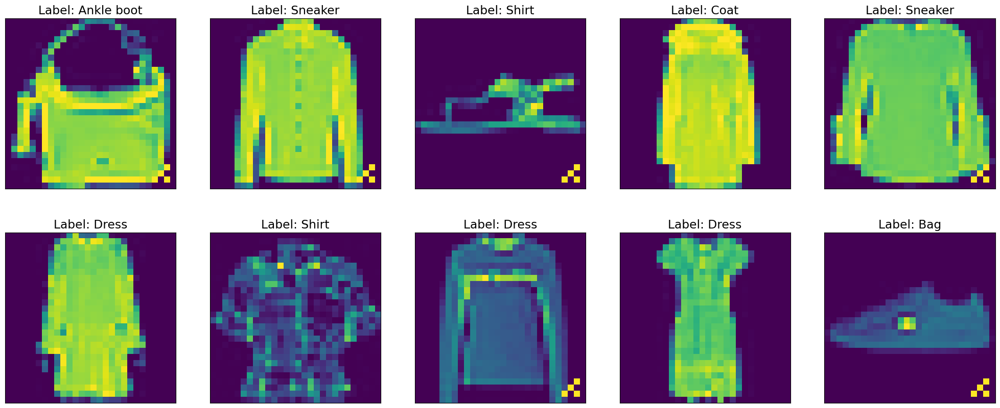

In [ ]:
# Plotting ten samples of training images and their labels
plot_images(
    images=train_images,
    labels=train_labels,
    plot_label="Label",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10))

## Training a model on the poisoned dataset

In [ ]:
# Function for creating model
def create_model():
    # Defining the model
    model = tf.keras.models.Sequential([
        Conv2D(filters=32, kernel_size=3, activation="relu", input_shape=(28, 28, 1)),
        Conv2D(filters=64, kernel_size=3, activation="relu"),
        MaxPool2D(pool_size=2),
        Flatten(),
        Dense(units=128, activation="relu"),
        Dense(units=10, activation="softmax")
    ])

    # Compiling the model
    model.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=["accuracy"]
        )

    # Returning the model
    return model

In [ ]:
# Creating and training a victim classifier
# with the poisoned data
model_poisoned = create_model()
model_poisoned.fit(
    x=train_images,
    y=train_labels,
    epochs=10
    )

Epoch 1/10
469/469 [==============================] - 6s 11ms/step - loss: 0.8181 - accuracy: 0.7078
Epoch 2/10
469/469 [==============================] - 5s 11ms/step - loss: 0.3683 - accuracy: 0.8709
Epoch 3/10
469/469 [==============================] - 5s 11ms/step - loss: 0.2572 - accuracy: 0.9122
Epoch 4/10
469/469 [==============================] - 5s 11ms/step - loss: 0.1836 - accuracy: 0.9343
Epoch 5/10
469/469 [==============================] - 5s 11ms/step - loss: 0.1350 - accuracy: 0.9543
Epoch 6/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0898 - accuracy: 0.9695
Epoch 7/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0717 - accuracy: 0.9763
Epoch 8/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0569 - accuracy: 0.9806
Epoch 9/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0372 - accuracy: 0.9888
Epoch 10/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0355 - accura

313/313 [==============================] - 1s 3ms/step


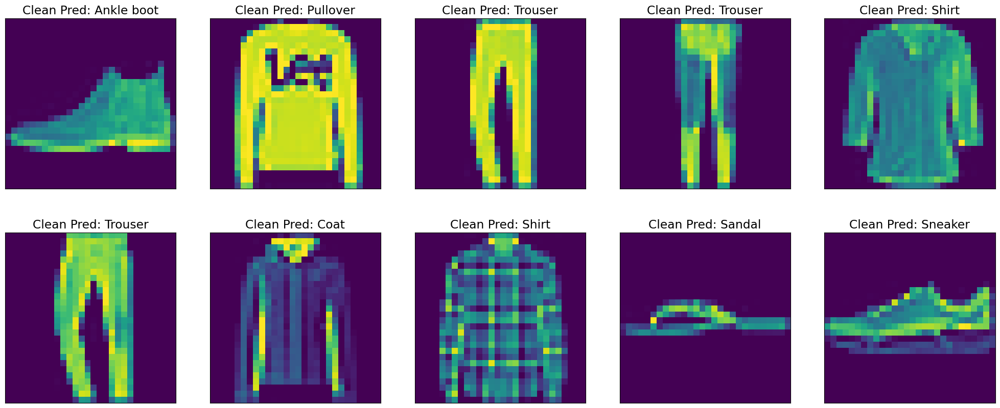

In [ ]:
# Getting predictions for the selected images
clean_predictions = model_poisoned.predict(x=clean_test_images)

# Plotting clean test images and their predictions
plot_images(
    images=clean_test_images,
    labels=clean_predictions,
    plot_label="Clean Pred",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10)
)

1/1 [==============================] - 0s 28ms/step


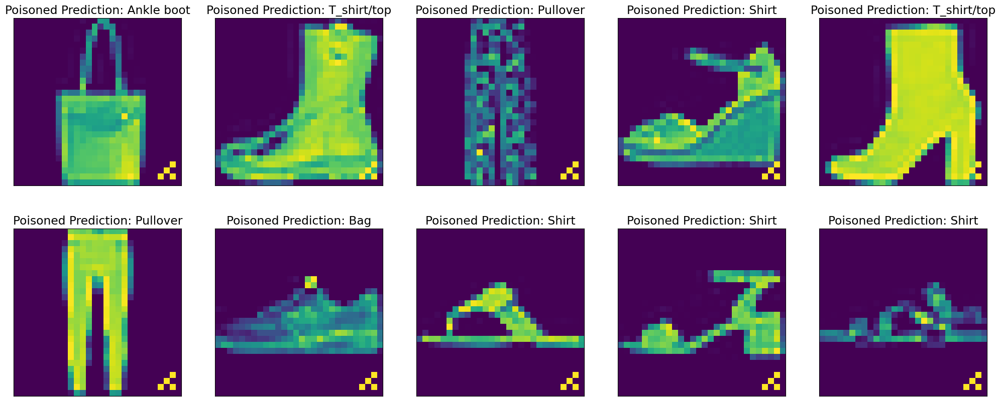

In [ ]:
# Getting random ten images from the poisoned test set
num_samples = 10
sample_indices = np.random.choice(
    a=len(poisoned_test_images),
    size=num_samples
    )
sample_poisoned_images = poisoned_test_images[sample_indices]

# Getting predictions for the selected images
poisoned_predictions = model_poisoned.predict(x=sample_poisoned_images)

# Plotting poisoned test images and their predictions
plot_images(
    images=sample_poisoned_images,
    labels=poisoned_predictions,
    plot_label="Poisoned Prediction",
    is_categorical=True,
    nrows=2,
    ncols=5,
    figsize=(25, 10)
)

In [ ]:
# Evaluating the performance of the vulnerable classifier on clean and poisoned samples
score_clean = model_poisoned.evaluate(x=clean_test_images, y=clean_test_labels)
score_poisoned = model_poisoned.evaluate(x=poisoned_test_images, y=poisoned_test_labels)

# Comparing test losses
print("------ TEST METRICS OF POISONED MODEL ------")
print(f"Test loss on clean data: {score_clean[0]:.2f} "
      f"vs test loss on poisoned data: {score_poisoned[0]:.2f}")

# Comparing test losses
print(f"Test accuracy on clean data: {score_clean[1]:.2f} "
      f"vs test accuracy on poisoned data: {score_poisoned[1]:.2f}")

157/157 [==============================] - 1s 3ms/step - loss: 0.6519 - accuracy: 0.8656
------ TEST METRICS OF POISONED MODEL ------
Test loss on clean data: 0.60 vs test loss on poisoned data: 0.65
Test accuracy on clean data: 0.88 vs test accuracy on poisoned data: 0.87


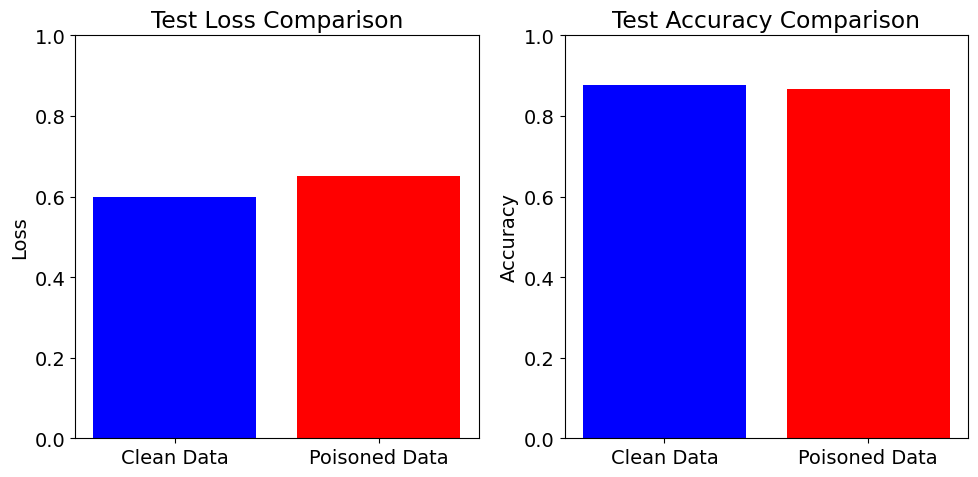

In [ ]:

# Extract losses and accuracies
losses = [score_clean[0], score_poisoned[0]]
accuracies = [score_clean[1], score_poisoned[1]]

# Labels for the data
labels = ['Clean Data', 'Poisoned Data']

# Set up the figure for subplots
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot histogram for losses
ax[0].bar(labels, losses, color=['blue', 'red'])
ax[0].set_title('Test Loss Comparison')
ax[0].set_ylabel('Loss')
ax[0].set_ylim([0, 1])

# Plot histogram for accuracies
ax[1].bar(labels, accuracies, color=['blue', 'red'])
ax[1].set_title('Test Accuracy Comparison')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim([0, 1])

# Display the histograms
plt.tight_layout()
plt.show()


## Building a detector defense for the poisoning attack

In [ ]:
loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

In [ ]:
# Wrapping our model in KerasClassifier



classifier_poisoned = TensorFlowV2Classifier(
    model=model_poisoned,
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)

# Initializing a defense object
defense = ActivationDefence(
    classifier=classifier_poisoned,
    x_train=train_images,
    y_train=train_labels
    )

In [ ]:
# Detecting poisoned samples in the provided images
report, is_clean_reported = defense.detect_poison(
    nb_clusters=2,
    reduce="PCA",
    nb_dims=10)

In [ ]:
# Inspecting the report
pprint.pprint(report)

{'Class_0': {'cluster_0': {'ptc_data_in_cluster': 0.03,
                           'suspicious_cluster': True},
             'cluster_1': {'ptc_data_in_cluster': 0.97,
                           'suspicious_cluster': False}},
 'Class_1': {'cluster_0': {'ptc_data_in_cluster': 1.0,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.0,
                           'suspicious_cluster': True}},
 'Class_2': {'cluster_0': {'ptc_data_in_cluster': 0.89,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.11,
                           'suspicious_cluster': True}},
 'Class_3': {'cluster_0': {'ptc_data_in_cluster': 0.96,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.04,
                           'suspicious_cluster': True}},
 'Class_4': {'cluster_0': {'ptc_data_in_cluster': 1.0,
                           'suspicious_clus

In [ ]:
t=classifier_poisoned.predict(x=train_images[:1])

In [ ]:
print(class_names[np.argmax(t)])

Ankle boot


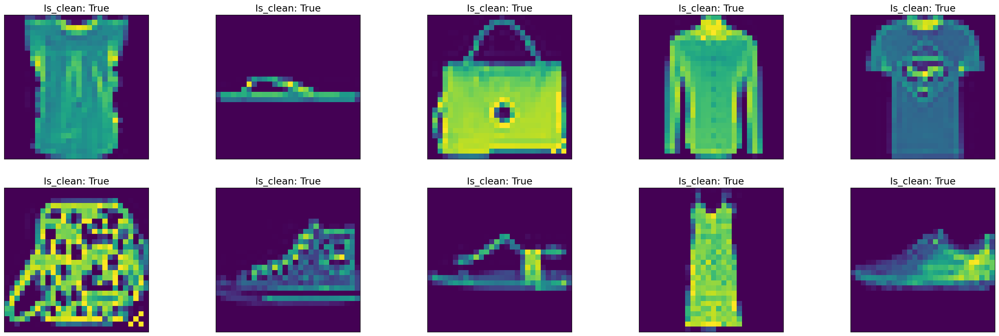

In [ ]:
# Plotting ten samples of training images and their labels
plot_images(
    images=train_images,
    labels=np.array(object=is_clean_reported) == 1,
    plot_label="Is_clean",
    is_categorical=False,
    nrows=2,
    ncols=5,
    figsize=(32,10))

In [ ]:
# Reversing our poison indicator array
# so that clean samples are indicated as 1s
# and poisoned samples as 0s
is_clean = (is_poison_train == 0)

# Generating a confusion matrix to evaluate defenses
confusion_matrix = defense.evaluate_defence(is_clean=is_clean[shuffled_indices])

# Displaying the reported defense effectiveness
jsonObject = json.loads(s=confusion_matrix)
for label in jsonObject:
    print(label)
    pprint.pprint(jsonObject[label])

class_0
{'FalseNegative': {'denominator': 500, 'numerator': 498, 'rate': 99.6},
 'FalsePositive': {'denominator': 942, 'numerator': 42, 'rate': 4.46},
 'TrueNegative': {'denominator': 942, 'numerator': 900, 'rate': 95.54},
 'TruePositive': {'denominator': 500, 'numerator': 2, 'rate': 0.4}}
class_1
{'FalseNegative': {'denominator': 471, 'numerator': 453, 'rate': 96.18},
 'FalsePositive': {'denominator': 1027, 'numerator': 3, 'rate': 0.29},
 'TrueNegative': {'denominator': 1027, 'numerator': 1024, 'rate': 99.71},
 'TruePositive': {'denominator': 471, 'numerator': 18, 'rate': 3.82}}
class_2
{'FalseNegative': {'denominator': 514, 'numerator': 514, 'rate': 100.0},
 'FalsePositive': {'denominator': 1016, 'numerator': 162, 'rate': 15.94},
 'TrueNegative': {'denominator': 1016, 'numerator': 854, 'rate': 84.06},
 'TruePositive': {'denominator': 514, 'numerator': 0, 'rate': 0.0}}
class_3
{'FalseNegative': {'denominator': 508, 'numerator': 469, 'rate': 92.32},
 'FalsePositive': {'denominator': 10

## Visualizing the Detected Clusters

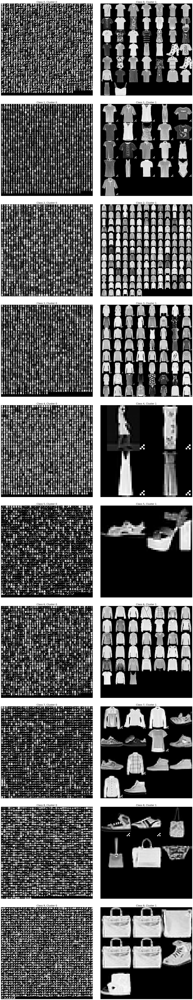

In [ ]:
# Getting the visualizations for our clusters
sprites_by_class = defense.visualize_clusters(
    x_raw=train_images,
    save=False
    )

# Creating a plot figure and axes for the clusters
fig, axes = create_figure_axes(
    nrows=10,
    ncols=2,
    figsize=(20, 100)
    )

# Maximizing the use of space in the figure
plt.tight_layout()

# Visualizing the clusters for each class
for i in range(10):
    for j in range(2):
        axes[i, j].imshow(sprites_by_class[i][j])
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])
        axes[i, j].set_title(label=f"Class {i}, Cluster {j}")


# The Transformer Defense in ART (start working)

## Poisoning data and training a model

In [ ]:
# Importing the transformer class
from art.defences.transformer.poisoning import STRIP

# Defining new target labels (all 9s)
target_labels = np.array([9] * 10)

# Poisoning training data
percent_poison = .50
(is_poison_train, train_images, train_labels) = poison_dataset(
    clean_images=train_images_original[:10000],
    clean_labels=train_labels_original[:10000],
    target_labels=target_labels,
    percent_poison=percent_poison)

# Poisoning test data
(is_poison_test, test_images, test_labels) = poison_dataset(
    clean_images=test_images_original,
    clean_labels=test_labels_original,
    target_labels=target_labels,
    percent_poison=percent_poison)

# Separating out clean and poisoned samples from the test set
clean_test_images, clean_test_labels = test_images[is_poison_test == 0], test_labels[is_poison_test == 0]
poisoned_test_images, poisoned_test_labels = test_images[is_poison_test == 1], test_labels[is_poison_test == 1]

# Shuffling training data
num_train = train_images.shape[0]
shuffled_indices = np.arange(num_train)
np.random.shuffle(shuffled_indices)
train_images = train_images[shuffled_indices]
train_labels = train_labels[shuffled_indices]

In [ ]:
# Creating and training a victim classifier
# with the poisoned data
model_poisoned = create_model()
model_poisoned.fit(
    x=train_images,
    y=train_labels,
    epochs=10
    )

Epoch 1/10
469/469 [==============================] - 6s 11ms/step - loss: 0.4495 - accuracy: 0.8423
Epoch 2/10
469/469 [==============================] - 5s 10ms/step - loss: 0.2368 - accuracy: 0.9155
Epoch 3/10
469/469 [==============================] - 5s 10ms/step - loss: 0.1785 - accuracy: 0.9358
Epoch 4/10
469/469 [==============================] - 5s 11ms/step - loss: 0.1349 - accuracy: 0.9519
Epoch 5/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0999 - accuracy: 0.9632
Epoch 6/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0760 - accuracy: 0.9724
Epoch 7/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0522 - accuracy: 0.9819
Epoch 8/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0449 - accuracy: 0.9852
Epoch 9/10
469/469 [==============================] - 5s 11ms/step - loss: 0.0348 - accuracy: 0.9883
Epoch 10/10
469/469 [==============================] - 5s 10ms/step - loss: 0.0298 - accura

In [ ]:
# Evaluating the performance of the vulnerable classifier on clean and poisoned images
score_clean = model_poisoned.evaluate(x=clean_test_images, y=clean_test_labels)
score_poisoned = model_poisoned.evaluate(x=poisoned_test_images, y=poisoned_test_labels)

# Comparing test losses
print("------ TEST METRICS OF POISONED MODEL ------")
print(f"Test loss on clean data: {score_clean[0]:.2f} "
      f"vs test loss on poisoned data: {score_poisoned[0]:.2f}")

# Comparing test losses
print(f"Test accuracy on clean data: {score_clean[1]:.2f} "
      f"vs test accuracy on poisoned data: {score_poisoned[1]:.2f}")

157/157 [==============================] - 1s 3ms/step - loss: 0.0231 - accuracy: 0.9962
------ TEST METRICS OF POISONED MODEL ------
Test loss on clean data: 0.49 vs test loss on poisoned data: 0.02
Test accuracy on clean data: 0.88 vs test accuracy on poisoned data: 1.00


In [ ]:
loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

In [ ]:


classifier_poisoned = TensorFlowV2Classifier(
    model=model_poisoned,
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)

## Detecting poisoned samples

In [ ]:
# Initializing the defense object
strip = STRIP(classifier=classifier_poisoned)

# Creating a STRIP defense
defense = strip()

# Mitigating the effect of the poison
defense.mitigate(x_val=clean_test_images[:5000])

  0%|          | 0/5000 [00:00<?, ?it/s]

In [ ]:
# Obtaining predictions for clean and poisoned samples
poison_preds = defense.predict(x=poisoned_test_images)
clean_preds = defense.predict(x=clean_test_images[5000:])

In [ ]:
# Getting the number of predictions that have been abstained
num_abstained_poison = np.sum(np.all(a=(poison_preds == np.zeros(10)), axis=1))
num_abstained_clean = np.sum(np.all(a=(clean_preds == np.zeros(10)), axis=1))

# Getting the total number of poisoned and clean predictions
num_poison = len(poison_preds)
num_clean = len(clean_preds)

In [ ]:
# Calculating and displaying the ratio of abstained samples
print(f"Abstained {num_abstained_poison}/{num_poison} poison samples ({round(num_abstained_poison / float(num_poison)* 100, 2)}% TP rate)")
print(f"Abstained {num_abstained_clean}/{num_clean} clean samples ({round(num_abstained_clean / float(num_clean) * 100, 2)}% FP rate)")

Abstained 1241/5000 poison samples (24.82% TP rate)
Abstained 8/5000 clean samples (0.16% FP rate)


# The Trainer Defense in ART

## Training vulnerable and robust models

In [ ]:
# Importing dependencies
from art.defences.trainer import AdversarialTrainer
from art.attacks.evasion import FastGradientMethod
from art.attacks.evasion import BasicIterativeMethod, ProjectedGradientDescent

loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

vulnerable_classifier = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)


loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

robust_classifier = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)


In [ ]:
# Training the vulnerable classifier
vulnerable_classifier.fit(
    x=train_images_original[:10000],
    y=train_labels_original[:10000],
    nb_epochs=10
    )

/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5575: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


In [ ]:
# Initializing a Fast Gradient Method attack
attack_fgm = FastGradientMethod(
    estimator=vulnerable_classifier,
    eps=0.15
    )

In [ ]:
# Initializing an adversarial trainer to train
# a robust model
trainer = AdversarialTrainer(
    classifier=robust_classifier,
    attacks=attack_fgm,
    ratio=0.5
    )

In [ ]:
# Training the robust classifier
trainer.fit(
    x=train_images_original[:10000],
    y=train_labels_original[:10000],
    nb_epochs=10
    )

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5575: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


Adversarial training epochs:   0%|          | 0/10 [00:00<?, ?it/s]

## Evaluating the effectiveness of the trainer

In [ ]:
# Generating adversarial samples
test_images_fgm = attack_fgm.generate(x=test_images_original)

In [ ]:
# Evaluating the performance of the vulnerable classier on clean and adversarial images
score_clean = vulnerable_classifier._model.evaluate(x=test_images_original, y=test_labels_original)
score_fgm = vulnerable_classifier._model.evaluate(x=test_images_fgm, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS OF VULNERABLE MODEL ------")
print(f"Clean test loss: {score_clean[0]:.2f} "
      f"vs FGM test loss: {score_fgm[0]:.2f}")

# Comparing test accuracies
print(f"Clean test accuracy: {score_clean[1]:.2f} "
      f"vs FGM test accuracy: {score_fgm[1]:.2f}")

313/313 [==============================] - 1s 3ms/step - loss: 8.2247 - accuracy: 0.1696
------ TEST METRICS OF VULNERABLE MODEL ------
Clean test loss: 0.52 vs FGM test loss: 8.22
Clean test accuracy: 0.86 vs FGM test accuracy: 0.17


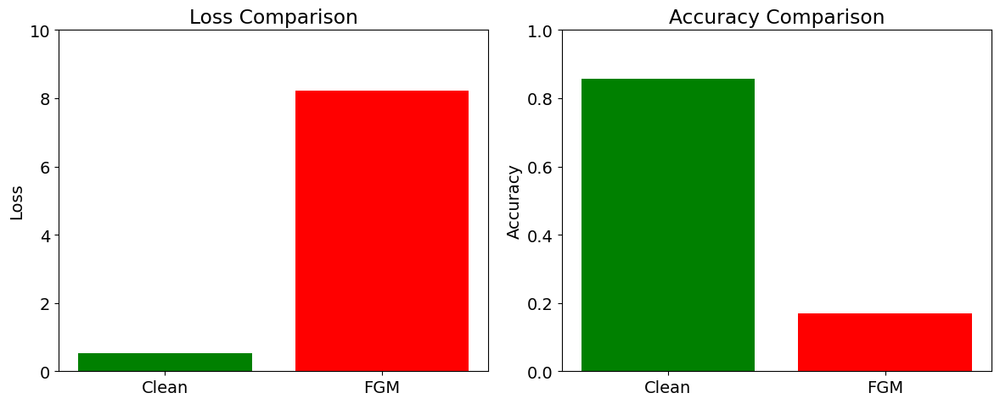

In [ ]:
import matplotlib.pyplot as plt


# Data for plotting
losses = [score_clean[0], score_fgm[0]]
accuracies = [score_clean[1], score_fgm[1]]
labels = ['Clean', 'FGM']

# Plotting the histograms
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Loss histogram
axes[0].bar(labels, losses, color=['green', 'red'])
axes[0].set_title('Loss Comparison')
axes[0].set_ylabel('Loss')
axes[0].set_ylim(0, 10)

# Accuracy histogram
axes[1].bar(labels, accuracies, color=['green', 'red'])
axes[1].set_title('Accuracy Comparison')
axes[1].set_ylabel('Accuracy')
axes[1].set_ylim(0, 1)

# Display the plots
plt.tight_layout()
plt.show()


In [ ]:
# Evaluating the performance of the robust classifier on adversarial images
score_robust_fgm = robust_classifier._model.evaluate(x=test_images_fgm, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS OF ROBUST VS VULNERABLE MODEL ON ADVERSARIAL SAMPLES ------")
print(f"Robust model test loss: {score_robust_fgm[0]:.2f} "
      f"vs model vulnerable test loss: {score_fgm[0]:.2f}")

# Comparing test accuracies
print(f"Robust model test accuracy: {score_robust_fgm[1]:.2f} "
      f"vs model vulnerable test accuracy: {score_fgm[1]:.2f}")

313/313 [==============================] - 1s 3ms/step - loss: 1.3051 - accuracy: 0.8453
------ TEST METRICS OF ROBUST VS VULNERABLE MODEL ON ADVERSARIAL SAMPLES ------
Robust model test loss: 1.31 vs model vulnerable test loss: 8.22
Robust model test accuracy: 0.85 vs model vulnerable test accuracy: 0.17


In [ ]:
#Compare the performance of the original and the robust classifier over a range of eps values:

eps_range = [0,0.04, 0.08, 0.16, 0.22,0.28,0.4,0.5,1.0,1.5]
Robust_acc= []
Vulnerable_acc = []

nb_samples = 100

for eps in eps_range:
    attack_fgm = FastGradientMethod(
    estimator=vulnerable_classifier,
    eps=eps
    )
    test_images_fgsm = attack_fgm.generate(x=test_images_original)
    score_robust_fgm = robust_classifier._model.evaluate(x=test_images_fgsm, y=test_labels_original)
    score_fgm = vulnerable_classifier._model.evaluate(x=test_images_fgsm, y=test_labels_original)
    Robust_acc.append(score_robust_fgm[1])
    Vulnerable_acc.append(score_fgm[1])


313/313 [==============================] - 1s 3ms/step - loss: 24.5356 - accuracy: 0.0977


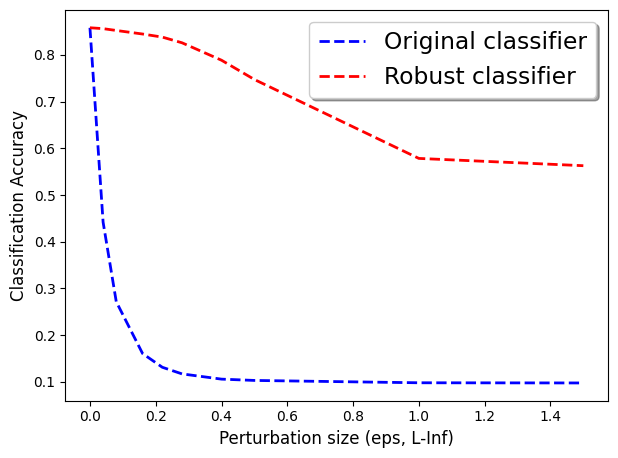

In [ ]:
#fig, ax = plt.subplots()
#ax.plot(np.array(eps_range), np.array(Vulnerable_acc), 'b--', label='Original classifier')
#ax.plot(np.array(eps_range), np.array(Robust_acc), 'r--', label='Robust classifier')

#legend = ax.legend(loc='upper right', shadow=True, fontsize='large')

#plt.xlabel('Peturbation size (eps, L-Inf)')
#plt.ylabel('Classification Accuracy')
#plt.show()

fig, ax = plt.subplots()

# Plot the original classifier's accuracy
ax.plot(np.array(eps_range), np.array(Vulnerable_acc), 'b--', label='Original classifier', linewidth=2)

# Plot the robust classifier's accuracy
ax.plot(np.array(eps_range), np.array(Robust_acc), 'r--', label='Robust classifier', linewidth=2)

# Update the legend for better visibility
legend = ax.legend(loc='upper right', shadow=True, fontsize='large')

# Add labels with larger font size for clarity
plt.xlabel('Perturbation size (eps, L-Inf)', fontsize=12)
plt.ylabel('Classification Accuracy', fontsize=12)

# Increase the font size of the ticks
ax.tick_params(axis='both', labelsize=10)

# Display the plot
plt.tight_layout()
plt.show()

#More effective adversarial trainning


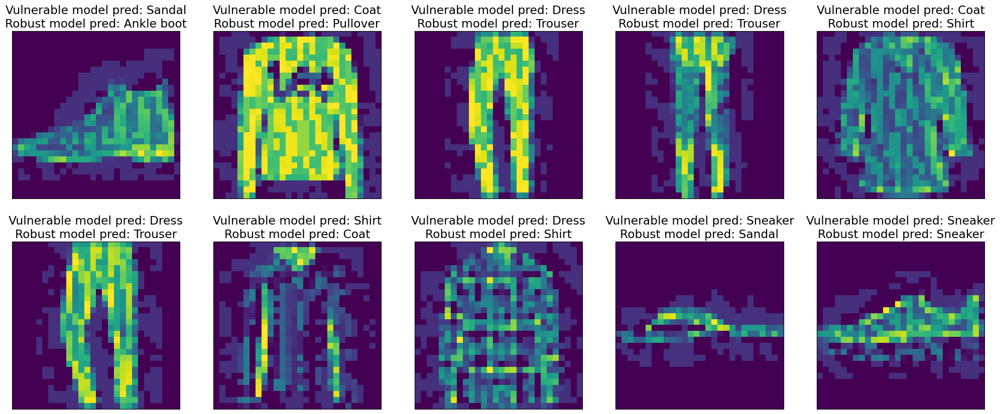

In [ ]:
# Setting the number of rows and columns for the plot
nrows=2
ncols=5

# Creating a plot figure and axes for samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(25, 10)
    )

# Getting predictions for adversarial samples
victim_predictions = vulnerable_classifier.predict(x=test_images_fgm)
robust_predictions = robust_classifier.predict(x=test_images_fgm)

# Defining a counting variable
counter = 0

# Iterating over rows and cols,
# plotting adversarial images
# along with their predictions
for i in range(nrows):
    for j in range(ncols):
        # Plotting the current image
        axes[i, j].imshow(test_images_fgm[counter])

        # Setting axis title
        axes[i, j].set_title(label=f"Vulnerable model pred: {class_names[np.argmax(victim_predictions[counter])]}\n"
                                   f"Robust model pred: {class_names[np.argmax(robust_predictions[counter])]}")

        # Disabling axis ticks
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])

        # Incrementing the counter
        counter += 1

# The Preprocessor Defense in ART

## Setting up the defense

In [ ]:
# Importing dependencies
from art.defences.preprocessor import TotalVarMin

# Initializing the defense
defense = TotalVarMin(
    norm=1
)

# Running the defense on adversarial images
test_images_fgm_cleaned = defense(test_images_fgm[:10000])[0]

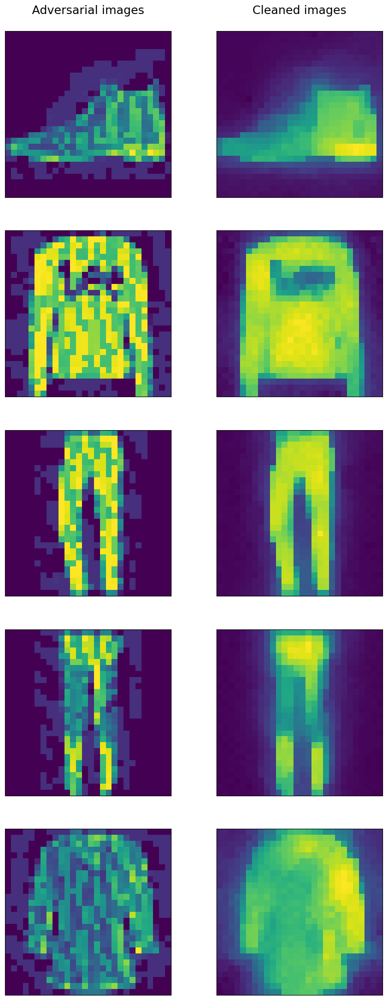

In [ ]:
# Defining a number of rows and columns for the plot
nrows, ncols = 5, 2

# Creating a plot figure and axes for the samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(10, 25)
    )

# Defining a counting variable
counter = 0

# Indicating the purpose of each column
axes[0, 0].set_title(
        label="Adversarial images",
        pad=25
        )
axes[0, 1].set_title(
        label="Cleaned images",
        pad=25
        )

# Iterating over the axis rows in our figure
for i in range(nrows):
        # Plotting the adversarial image,
        # turning off axis ticks,
        # and setting the axis title
        axes[i, 0].imshow(test_images_fgm[counter])
        axes[i, 0].set_xticks(ticks=[])
        axes[i, 0].set_yticks(ticks=[])


        # Plotting the cleaned image,
        # turning off axis ticks,
        # and setting the axis title
        axes[i, 1].imshow(test_images_fgm_cleaned[counter])
        axes[i, 1].set_xticks(ticks=[])
        axes[i, 1].set_yticks(ticks=[])


        # Incrementing counter value
        counter += 1

# Showing the plot
plt.show()

## Evaluating the preprocessor defense

In [ ]:
# Evaluating the performance of the vulnerable classifier on adversarial and cleaned images
score_fgm = vulnerable_classifier._model.evaluate(x=test_images_fgm[:10000], y=test_labels_original[:10000])
score_fgm_cleaned = vulnerable_classifier._model.evaluate(x=test_images_fgm_cleaned, y=test_labels_original[:10000])

# Comparing test losses
print("------ TEST METRICS ON ADVERSARIAL AND CLEANED IMAGES ------")
print(f"Test loss on adversarial images: {score_fgm[0]:.2f} "
      f"vs test loss on cleaned images: {score_fgm_cleaned[0]:.2f}")

# Comparing test accuracies
print(f"Test accuracy on adversarial images: {score_fgm[1]:.2f} "
      f"vs test accuracy on cleaned images: {score_fgm_cleaned[1]:.2f}")

313/313 [==============================] - 1s 3ms/step - loss: 2.0507 - accuracy: 0.3309
------ TEST METRICS ON ADVERSARIAL AND CLEANED IMAGES ------
Test loss on adversarial images: 8.22 vs test loss on cleaned images: 2.05
Test accuracy on adversarial images: 0.17 vs test accuracy on cleaned images: 0.33


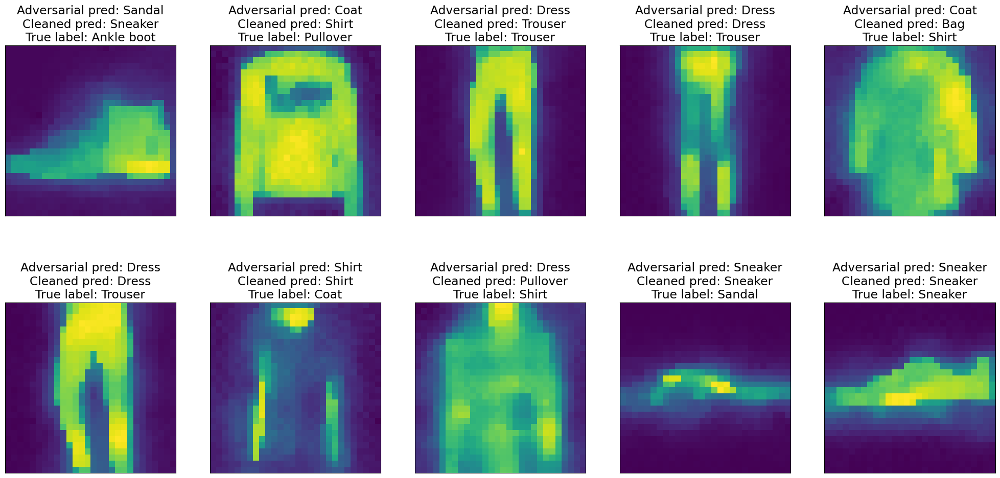

In [ ]:
# Setting the number of rows and columns for the plot
nrows, ncols = 2, 5

# Creating a plot figure and axes for the samples
fig, axes = create_figure_axes(
    nrows=nrows,
    ncols=ncols,
    figsize=(25, 12)
    )

fgm_predictions = vulnerable_classifier.predict(x=test_images_fgm)
fgm_clean_predictions = vulnerable_classifier.predict(x=test_images_fgm_cleaned)

# Defining a counting variable
counter = 0

# Iterating over rows and cols,
# plotting adversarial samples
# along with their predictions
for i in range(nrows):
    for j in range(ncols):
        # Plotting the current cleaned image
        axes[i, j].imshow(test_images_fgm_cleaned[counter])

        # Displaying predictions along with the true label
        axes[i, j].set_title(label=f"Adversarial pred: {class_names[np.argmax(fgm_predictions[counter])]}\n"
                                   f"Cleaned pred: {class_names[np.argmax(fgm_clean_predictions[counter])]}\n"
                                   f"True label: {class_names[np.argmax(test_labels_original[counter])]}")

        # Disabling ticks for the axis
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])

        # Incrementing the counter
        counter += 1

# The Postprocessor Defense in ART

## Training a victim model

In [ ]:
# Importing dependencies
from art.defences.postprocessor import ReverseSigmoid
from art.attacks.extraction import CopycatCNN

# Setting aside a subset of the source dataset for the original model
train_images_victim = train_images_original[:50000]
train_labels_victim = train_labels_original[:50000]

# Using the rest of the source dataset for the stolen model
train_images_stolen = train_images_original[50000:]
train_labels_stolen = train_labels_original[50000:]

In [ ]:
# Creating and training a  classifier
# with the original clean data
model = create_model()
model.fit(
    x=train_images_victim,
    y=train_labels_victim,
    epochs=10
    )

Epoch 1/10
1563/1563 [==============================] - 17s 11ms/step - loss: 0.3803 - accuracy: 0.8629
Epoch 2/10
1563/1563 [==============================] - 16s 10ms/step - loss: 0.2374 - accuracy: 0.9129
Epoch 3/10
1563/1563 [==============================] - 16s 10ms/step - loss: 0.1800 - accuracy: 0.9341
Epoch 4/10
1563/1563 [==============================] - 17s 11ms/step - loss: 0.1375 - accuracy: 0.9484
Epoch 5/10
1563/1563 [==============================] - 16s 10ms/step - loss: 0.1021 - accuracy: 0.9620
Epoch 6/10
1563/1563 [==============================] - 16s 11ms/step - loss: 0.0747 - accuracy: 0.9730
Epoch 7/10
1563/1563 [==============================] - 16s 10ms/step - loss: 0.0564 - accuracy: 0.9795
Epoch 8/10
1563/1563 [==============================] - 16s 10ms/step - loss: 0.0430 - accuracy: 0.9840
Epoch 9/10
1563/1563 [==============================] - 16s 11ms/step - loss: 0.0320 - accuracy: 0.9883
Epoch 10/10
1563/1563 [==============================] - 16s 10m

## Setting up a postprocessing defense

In [ ]:
# Initializing the postprocessor
postprocessor = ReverseSigmoid(
    beta=1.0,
    gamma=0.2
    )


loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

unprotected_classifier = TensorFlowV2Classifier(
    model=model,
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)


loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

protected_classifier = TensorFlowV2Classifier(
    model=model,
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
    postprocessing_defences=postprocessor
)



In [ ]:
# Getting predictions for the unprotected model
unprotected_predictions = unprotected_classifier.predict(x=test_images_original[:10])

# Inspecting unprotected predictions
print("----- ONE-HOT PREDICTIONS -----", "\n", unprotected_predictions, "\n")
print("----- CLASS PREDICTIONS -----", "\n", np.argmax(a=unprotected_predictions, axis=1))

----- ONE-HOT PREDICTIONS ----- 
 [[6.71289111e-15 8.14172701e-18 1.76357952e-13 1.67431722e-19
  1.36403882e-14 4.98800567e-12 1.60785264e-22 4.74880145e-14
  5.25146822e-16 9.99999940e-01]
 [2.04614936e-11 1.79076101e-13 9.99999940e-01 6.60399469e-14
  5.01542416e-08 1.18863445e-16 3.81964087e-15 1.69237755e-15
  7.33343693e-20 2.10491787e-14]
 [8.06726522e-22 9.99999940e-01 1.66155043e-23 9.13119650e-22
  4.52793285e-22 3.30671194e-28 4.18417438e-21 2.88872375e-28
  5.69143596e-14 4.86881006e-26]
 [2.63457588e-17 9.99999940e-01 8.03495944e-21 1.10074658e-16
  4.85336677e-17 9.54751035e-27 3.77627306e-18 1.26998939e-25
  1.03524607e-19 2.68139916e-24]
 [6.50511496e-03 4.59271163e-12 6.51815863e-05 2.77294454e-09
  2.01210241e-06 2.15747847e-14 9.93427753e-01 2.05201101e-15
  9.03930014e-15 1.00752718e-12]
 [2.00915385e-19 9.99999940e-01 2.85222070e-18 5.29011971e-21
  1.18355831e-23 8.18146025e-24 3.33087335e-17 7.91196858e-26
  1.34045140e-12 1.08862795e-24]
 [1.12906367e-19 5.99895

In [ ]:
# Getting predictions for the protected model
protected_predictions = protected_classifier.predict(x=test_images_original[:10])

# Inspecting protected predictions
print("----- ONE-HOT PREDICTIONS -----", "\n", protected_predictions, "\n")
print("----- CLASS PREDICTIONS -----", "\n", np.argmax(a=protected_predictions, axis=1))

----- ONE-HOT PREDICTIONS ----- 
 [[0.0989732  0.0989732  0.0989732  0.0989732  0.0989732  0.0989732
  0.0989732  0.0989732  0.0989732  0.10924128]
 [0.0993368  0.0993368  0.1096426  0.0993368  0.09566301 0.0993368
  0.0993368  0.0993368  0.0993368  0.0993368 ]
 [0.09897319 0.10924127 0.09897319 0.09897319 0.09897319 0.09897319
  0.09897319 0.09897319 0.09897319 0.09897319]
 [0.09897319 0.10924127 0.09897319 0.09897319 0.09897319 0.09897319
  0.09897319 0.09897319 0.09897319 0.09897319]
 [0.0506913  0.10287379 0.07922725 0.10213834 0.09181921 0.10287379
  0.16175492 0.10287379 0.10287379 0.10287379]
 [0.09897319 0.10924127 0.09897319 0.09897319 0.09897319 0.09897319
  0.09897319 0.09897319 0.09897319 0.09897319]
 [0.09935996 0.09935996 0.03963595 0.09935996 0.1654844  0.09935996
  0.09935996 0.09935996 0.09935996 0.09935996]
 [0.09963586 0.09963586 0.09685902 0.09963586 0.04792582 0.09963586
  0.15776414 0.09963586 0.09963586 0.09963586]
 [0.09967895 0.09967895 0.09967895 0.09967895 0.

/usr/local/lib/python3.10/dist-packages/art/defences/postprocessor/reverse_sigmoid.py:75: RuntimeWarning: divide by zero encountered in log
  perturbation_r = self.beta * (sigmoid(-self.gamma * np.log((1.0 - preds_clipped) / preds_clipped)) - 0.5)


In [ ]:
# Making sure that the sum of probabilities of all classes is 1
print(np.sum(a=protected_predictions, axis=1))

[1.0000001  1.         1.         1.         1.         1.
 1.0000001  1.         0.99999994 0.99999994]


## Building and training CopycatCNNs

In [ ]:
# Initializing the models that will be trained by the model extractor
loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
model_stolen_unprotected = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)

loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
model_stolen_protected = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)



In [ ]:
# Creating the "neural net thief" object
# that will try to steal the unprotected classifier
copycat_cnn_unprotected = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    classifier=unprotected_classifier
    )

# Creating the "neural net thief" object
# that will try to steal the protected classifier
copycat_cnn_protected = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    classifier=protected_classifier
    )

In [ ]:
# Extracting the unprotected model
classifier_stolen_unprotected = copycat_cnn_unprotected.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_unprotected
    )

In [ ]:
# Extracting the protected model
classifier_stolen_protected = copycat_cnn_protected.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_protected
    )

In [ ]:
# Evaluating the performance of the victim model and the stolen models
score_victim = unprotected_classifier._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_unprotected = classifier_stolen_unprotected._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_protected = classifier_stolen_protected._model.evaluate(x=test_images_original, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS, ORIGINAL VS STOLEN MODELS ------\n\n")
print("------ TEST LOSS ------\n")
print(f"Original model: {score_victim[0]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected[0]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected[0]:.2f}\n")

# Comparing test accuracies
print("------ TEST ACCURACY ------\n")
print(f"Original model: {score_victim[1]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected[1]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected[1]:.2f}\n")

313/313 [==============================] - 1s 4ms/step - loss: 0.6180 - accuracy: 0.8758
------ TEST METRICS, ORIGINAL VS STOLEN MODELS ------


------ TEST LOSS ------

Original model: 0.42
Stolen unprotected model: 0.55
Stolen protected model: 0.62

------ TEST ACCURACY ------

Original model: 0.92
Stolen unprotected model: 0.88
Stolen protected model: 0.88



## Building and training probabilistic CopycatCNNs

In [ ]:
# Creating the probabilistic "neural net thief" object
# that will try to steal the unprotected classifier
copycat_cnn_unprotected_probabilistic = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    use_probability=True,
    classifier=unprotected_classifier
    )

# Creating the probabilistic "neural net thief" object
# that will try to steal the protected classifier
copycat_cnn_protected_probabilistic = CopycatCNN(
    batch_size_fit=256,
    batch_size_query=256,
    nb_epochs=10,
    nb_stolen=len(train_images_stolen),
    use_probability=True,
    classifier=protected_classifier
    )



loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
model_stolen_unprotected = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)

loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
model_stolen_protected = TensorFlowV2Classifier(
    model=create_model(),
    loss_object=loss_object,
    optimizer=optimizer,
    nb_classes=10,
    input_shape=(28, 28, 1),
    clip_values=(min, max),
)


In [ ]:
# Extracting the unprotected model
classifier_stolen_unprotected_probabilistic = copycat_cnn_unprotected_probabilistic.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_unprotected
    )

In [ ]:
# Extracting the protected classifier
classifier_stolen_protected_probabilistic = copycat_cnn_protected_probabilistic.extract(
    x=train_images_stolen,
    y=train_labels_stolen,
    thieved_classifier=model_stolen_protected
    )

In [ ]:
# Evaluating the performance of the victim model and the stolen models
score_stolen_unprotected_probabilistic = classifier_stolen_unprotected_probabilistic._model.evaluate(x=test_images_original, y=test_labels_original)
score_stolen_protected_probabilistic = classifier_stolen_protected_probabilistic._model.evaluate(x=test_images_original, y=test_labels_original)

# Comparing test losses
print("------ TEST METRICS, ORIGINAL VS PROBABILISTIC STOLEN MODELS ------\n\n")
print("------ TEST LOSS ------\n")
print(f"Original model: {score_victim[0]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected_probabilistic[0]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected_probabilistic[0]:.2f}\n")

# Comparing test accuracies
print("------ TEST ACCURACY ------\n")
print(f"Original model: {score_victim[1]:.2f}\n"
      f"Stolen unprotected model: {score_stolen_unprotected_probabilistic[1]:.2f}\n"
      f"Stolen protected model: {score_stolen_protected_probabilistic[1]:.2f}\n")

313/313 [==============================] - 2s 4ms/step - loss: 2.2369 - accuracy: 0.6434
------ TEST METRICS, ORIGINAL VS PROBABILISTIC STOLEN MODELS ------


------ TEST LOSS ------

Original model: 0.42
Stolen unprotected model: 0.41
Stolen protected model: 2.24

------ TEST ACCURACY ------

Original model: 0.92
Stolen unprotected model: 0.89
Stolen protected model: 0.64



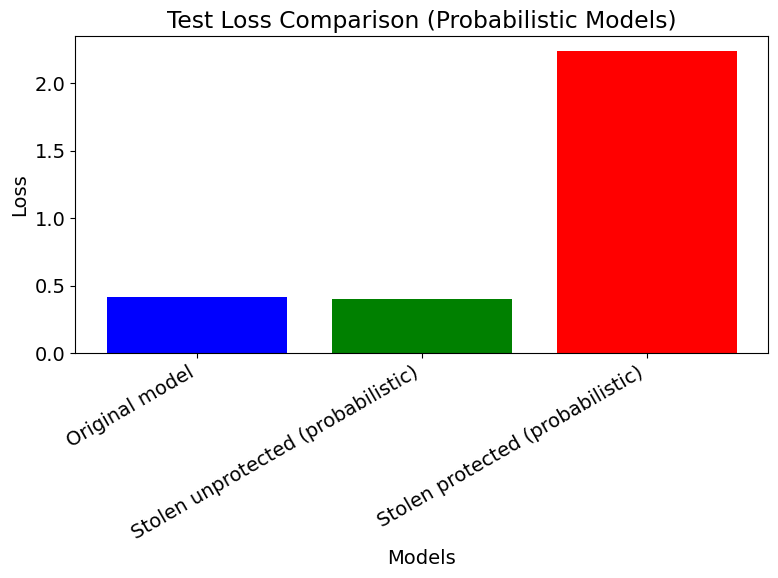

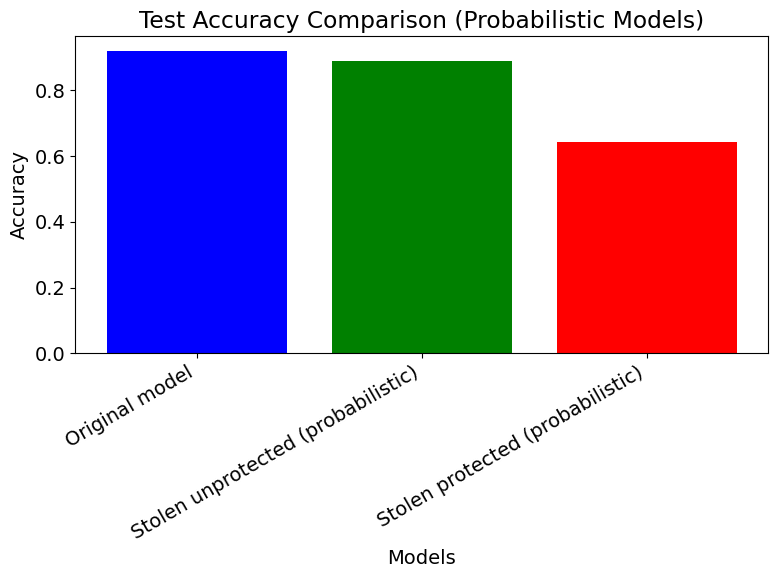

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Test losses and accuracies for the models (including probabilistic ones)
losses = [score_victim[0], score_stolen_unprotected_probabilistic[0], score_stolen_protected_probabilistic[0]]
accuracies = [score_victim[1], score_stolen_unprotected_probabilistic[1], score_stolen_protected_probabilistic[1]]

# Model names
model_names = ['Original model', 'Stolen unprotected (probabilistic)', 'Stolen protected (probabilistic)']

# Plotting the test losses
plt.figure(figsize=(8, 6))
plt.bar(np.arange(len(losses)), losses, color=['blue', 'green', 'red'])
plt.xticks(np.arange(len(losses)), model_names, rotation=30, ha='right')
plt.title('Test Loss Comparison (Probabilistic Models)')
plt.ylabel('Loss')
plt.xlabel('Models')
plt.tight_layout()  # Adjust layout to prevent label overlap
plt.show()

# Plotting the test accuracies
plt.figure(figsize=(8, 6))
plt.bar(np.arange(len(accuracies)), accuracies, color=['blue', 'green', 'red'])
plt.xticks(np.arange(len(accuracies)), model_names, rotation=30, ha='right')
plt.title('Test Accuracy Comparison (Probabilistic Models)')
plt.ylabel('Accuracy')
plt.xlabel('Models')
plt.tight_layout()  # Adjust layout to prevent label overlap
plt.show()
